In [1]:
# Importing all the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium

from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import learning_curve

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

from skopt import BayesSearchCV
from skopt.space import Integer, Categorical

import warnings

In [2]:
# loading housing dataset in dataframe df
df = pd.read_csv('kc_house_data.csv')

In [3]:
# displaying all columns
pd.set_option('display.max_columns',None)

## EDA

In [94]:
# Display basic information about the DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [95]:
# Get the dimensions of the DataFrame (rows, columns)
df.shape

(21613, 21)

In [96]:
# Get summary statistics for the numerical columns in the DataFrame
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [97]:
# Display the column names of the DataFrame
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [98]:
# Check for missing values in each column of the DataFrame
df.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

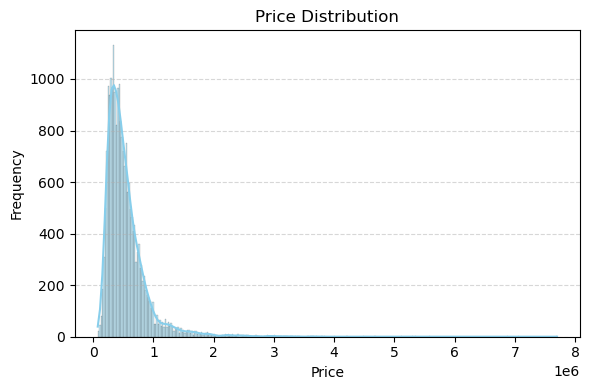

In [5]:
# Plotting the price distribution with a histogram and KDE curve
plt.figure(figsize=(6, 4))  
sns.histplot(df['price'], kde=True, color='skyblue')  
plt.title('Price Distribution', fontsize=12)
plt.xlabel('Price', fontsize=10)
plt.ylabel('Frequency', fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.5)  
plt.tight_layout() 
plt.show()

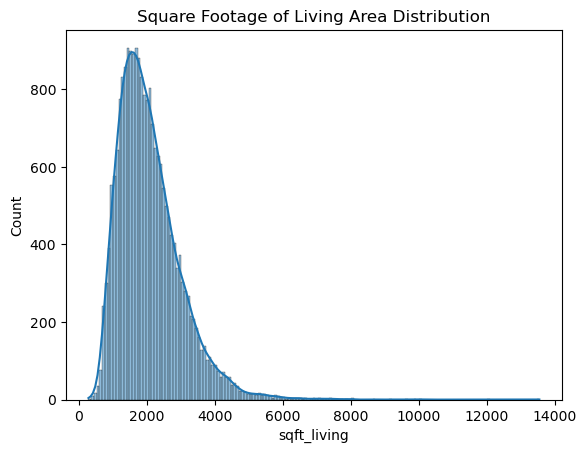

In [6]:
# Visualizing the distribution of the living area in square footage using a histogram and KDE curve
sns.histplot(df['sqft_living'], kde=True)
plt.title('Square Footage of Living Area Distribution')
plt.show()

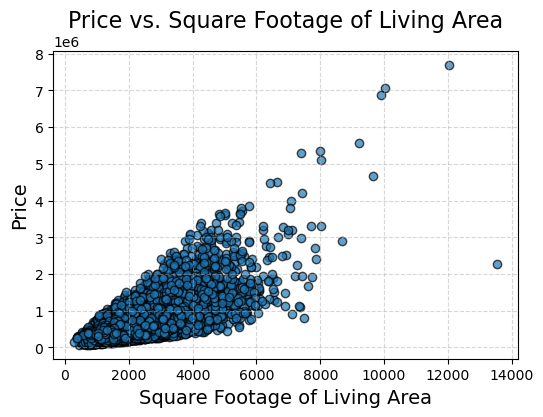

In [7]:
# Scatter plot for price vs. sqft_living
plt.figure(figsize=(6, 4))  # Set the figure size
plt.scatter(df['sqft_living'], df['price'], alpha=0.7, edgecolors='k')  
plt.title("Price vs. Square Footage of Living Area", fontsize=16)  
plt.xlabel("Square Footage of Living Area", fontsize=14) 
plt.ylabel("Price", fontsize=14)  
plt.grid(True, linestyle='--', alpha=0.5)  
plt.show() 

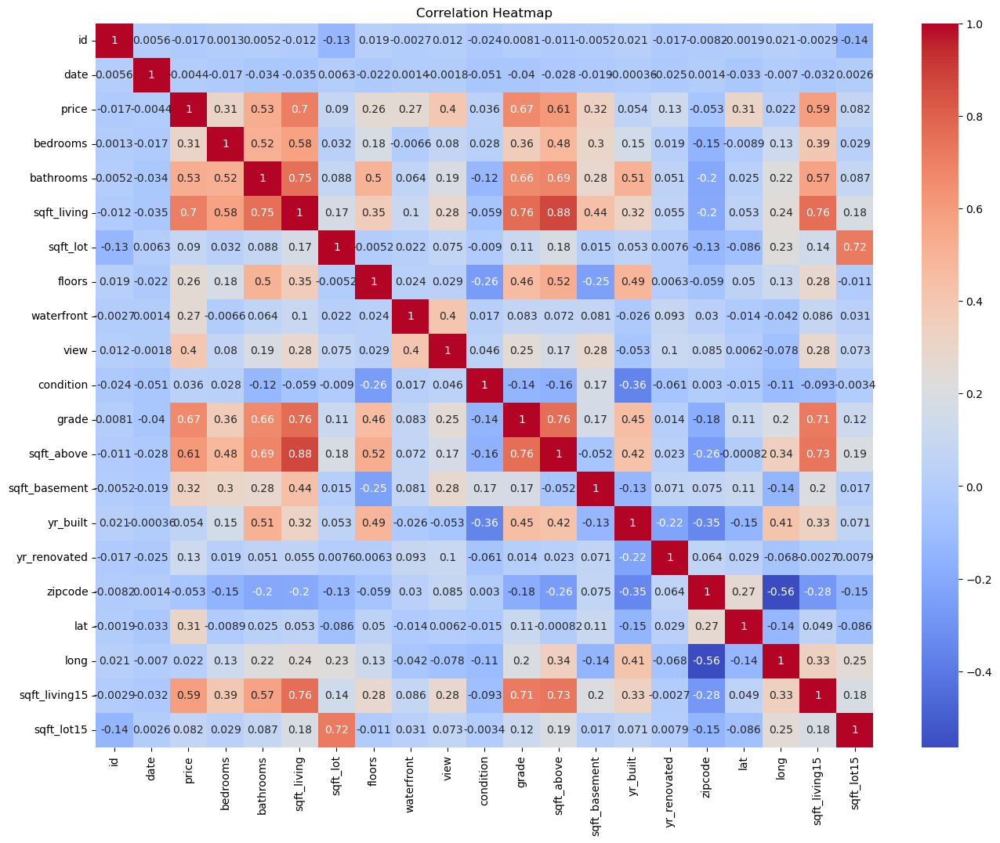

In [30]:
# Correlation Heatmap
df['date'] = pd.to_datetime(df['date'], format='%Y%m%dT%H%M%S')

plt.figure(figsize=(16, 12))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [83]:
# Compute correlation between price, sqft_above, and sqft_living
correlation = df[['price', 'sqft_above', 'sqft_living']].corr()
correlation

,price,sqft_above,sqft_living
price,1.000000,0.605567,0.702035
sqft_above,0.605567,1.000000,0.876597
sqft_living,0.702035,0.876597,1.000000


### Checking Outlier Count

In [84]:
# Detect and summarize outliers in numerical columns using IQR
numerical_cols = df.select_dtypes(include=np.number).columns

outlier_counts = {}

for col in numerical_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    outlier_counts[col] = len(outliers)

outlier_summary = pd.DataFrame.from_dict(outlier_counts, orient='index', columns=['Outlier Count'])
outlier_summary = outlier_summary[outlier_summary['Outlier Count'] > 0] 
outlier_summary

,Outlier Count
price,1146
bedrooms,546
bathrooms,571
sqft_living,572
sqft_lot,2425
waterfront,163
view,2124
condition,30
grade,1911
sqft_above,611


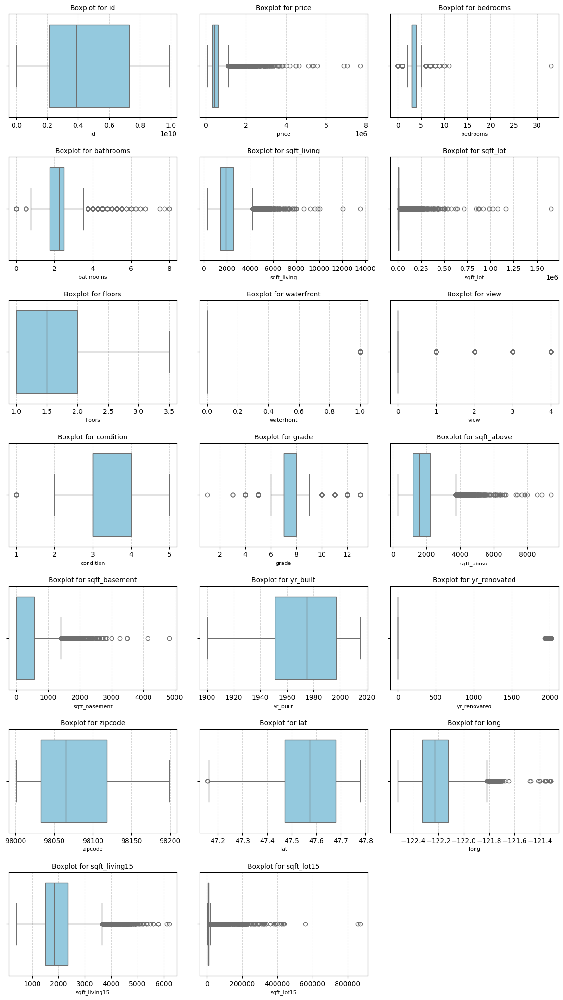

In [94]:
# Visualizing outlier in boxplots
def detect_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers

numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
rows = (len(numerical_columns) + 2) // 3  

plt.figure(figsize=(12, rows * 3))  
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(rows, 3, i) 
    sns.boxplot(x=df[column], color='skyblue')
    plt.title(f"Boxplot for {column}", fontsize=10)
    plt.xlabel(column, fontsize=8)
    plt.ylabel("")
    plt.grid(axis='x', linestyle='--', alpha=0.5)  
plt.tight_layout(pad=1.5)
plt.show()

### Checking skewness

In [85]:
# Analyze skewness of numerical columns and categorize it
numerical_cols = df.select_dtypes(include=np.number).columns
skewness = df[numerical_cols].skew()
skewness_summary = pd.DataFrame({'Column': skewness.index, 'Skewness': skewness.values})

def skew_category(value):
    if value < -1:
        return "Highly Left-Skewed"
    elif -1 <= value < -0.5:
        return "Moderately Left-Skewed"
    elif -0.5 <= value <= 0.5:
        return "Symmetric"
    elif 0.5 < value <= 1:
        return "Moderately Right-Skewed"
    else:
        return "Highly Right-Skewed"

skewness_summary['Category'] = skewness_summary['Skewness'].apply(skew_category)
skewness_summary = skewness_summary.sort_values(by='Skewness', ascending=False)
skewness_summary

,Column,Skewness,Category
5,sqft_lot,13.060019,Highly Right-Skewed
7,waterfront,11.385108,Highly Right-Skewed
19,sqft_lot15,9.506743,Highly Right-Skewed
14,yr_renovated,4.549493,Highly Right-Skewed
1,price,4.024069,Highly Right-Skewed
8,view,3.395750,Highly Right-Skewed
2,bedrooms,1.974300,Highly Right-Skewed
12,sqft_basement,1.577965,Highly Right-Skewed
4,sqft_living,1.471555,Highly Right-Skewed
11,sqft_above,1.446664,Highly Right-Skewed


### Unique values of columns

In [86]:
# Checking unique values 
columns_to_check = ['waterfront', 'view', 'condition', 'grade', 'zipcode', 'floors']

for col in columns_to_check:
    unique_values = df[col].unique()
    print(f"Unique values in {col}: {unique_values}")
    print(f"Number of unique values in {col}: {len(unique_values)}\n")

Unique values in waterfront: [0 1]
Number of unique values in waterfront: 2

Unique values in view: [0 3 4 2 1]
Number of unique values in view: 5

Unique values in condition: [3 5 4 1 2]
Number of unique values in condition: 5

Unique values in grade: [ 7  6  8 11  9  5 10 12  4  3 13  1]
Number of unique values in grade: 12

Unique values in zipcode: [98178 98125 98028 98136 98074 98053 98003 98198 98146 98038 98007 98115
 98107 98126 98019 98103 98002 98133 98040 98092 98030 98119 98112 98052
 98027 98117 98058 98001 98056 98166 98023 98070 98148 98105 98042 98008
 98059 98122 98144 98004 98005 98034 98075 98116 98010 98118 98199 98032
 98045 98102 98077 98108 98168 98177 98065 98029 98006 98109 98022 98033
 98155 98024 98011 98031 98106 98072 98188 98014 98055 98039]
Number of unique values in zipcode: 70

Unique values in floors: [1.  2.  1.5 3.  2.5 3.5]
Number of unique values in floors: 6



In [4]:
# Plot map with circle markers for each location
map_center = [df['lat'].mean(), df['long'].mean()]
m = folium.Map(location=map_center, zoom_start=10)
for idx, row in df.iterrows():
    folium.CircleMarker(location=[row['lat'], row['long']], radius=5).add_to(m)
m

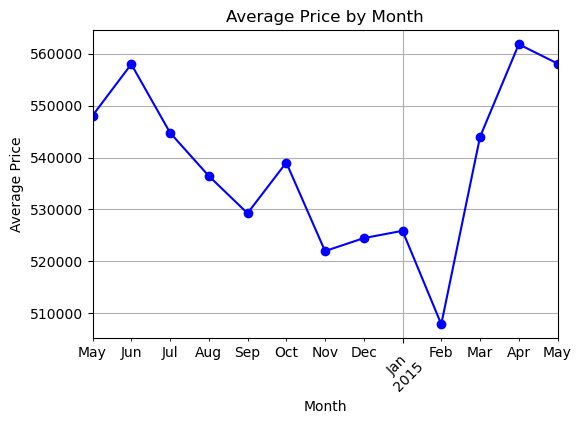

In [35]:
# Plot average price by month.
df['year_month'] = df['date'].dt.to_period('M')
monthly_avg_price = df.groupby('year_month')['price'].mean()

plt.figure(figsize=(6, 4))
monthly_avg_price.plot(kind='line', marker='o', color='b')
plt.title('Average Price by Month')
plt.xlabel('Month')
plt.ylabel('Average Price')
plt.xticks(rotation=45)
plt.grid(True)

## Linear Regression before pre-processing

In [56]:
# Separate features (X) and target (y) for prediction
X = df.drop(columns=['price', 'id', 'date'])
y = df['price']

In [57]:
# Split data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [58]:
# Train model and evaluate its performance using various metrics
lr = LinearRegression()
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R²): {r2}")

Mean Absolute Error (MAE): 127493.34208659218
Mean Squared Error (MSE): 45173046132.78921
Root Mean Squared Error (RMSE): 212539.51663817532
R-squared (R²): 0.7011904448878474


## Pre-Processing For Random Forest  and Gradient Boosting 

In [4]:
# Drop the 'id' and 'date' columns from the DataFrame
df =  df.drop(columns=['id', 'date'])

## Random Forest Regressor

### Feature and Target Seperation

In [100]:
# Separate features (X) and target (y) for prediction
X = df.drop(columns=['price'])
y = df['price']

In [101]:
# Split data into training, validation, and testing sets (70% train, 15% validation, 15% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=42)

### Model Training

In [102]:
# Train a Random Forest Regressor model using the training data 
rf_regressor = RandomForestRegressor(random_state=42)
rf_regressor.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [103]:
# Train model and evaluate its performance using various metrics
y_pred = rf_regressor.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R²): {r2}")

Mean Absolute Error (MAE): 75581.2776779839
Mean Squared Error (MSE): 24080789358.41305
Root Mean Squared Error (RMSE): 155179.86131716013
R-squared (R²): 0.8460430884215853


### Feature Importance

In [104]:
# Display the feature importances from the Random Forest Regressor model
feature_importances = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': rf_regressor.feature_importances_
})

feature_importances = feature_importances.sort_values(by='Importance', ascending=False)
feature_importances

,Feature,Importance
8,grade,0.332328
2,sqft_living,0.269641
14,lat,0.141309
15,long,0.062912
11,yr_built,0.038030
16,sqft_living15,0.030957
5,waterfront,0.027741
9,sqft_above,0.019509
13,zipcode,0.014617
3,sqft_lot,0.014512


### Model Training After Feature Reduction

In [105]:
# Create a copy of the features DataFrame and drop specific columns 
X_copy = X.copy()
X_copy = X_copy.drop(columns=['condition','bedrooms','floors','sqft_basement','yr_renovated','bathrooms'])

In [106]:
# Split data into training, validation, and testing sets (70% train, 15% validation, 15% test)
X_train, X_test, y_train, y_test = train_test_split(X_copy, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=42)

In [107]:
# Train model and evaluate its performance using various metrics
rf_regressor.fit(X_train, y_train)
y_pred = rf_regressor.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R²): {r2}")

Mean Absolute Error (MAE): 73183.98896804656
Mean Squared Error (MSE): 21933575566.309795
Root Mean Squared Error (RMSE): 148099.8837484682
R-squared (R²): 0.8806241960640652


### Bayesian Optimization

In [108]:
# Perform Bayesian hyperparameter optimization for the Random Forest Regressor model and display the best parameters
warnings.filterwarnings('ignore', category=UserWarning, module='skopt')

search_spaces = {
    'n_estimators': (100, 500),  
    'max_depth': (10, 50), 
    'min_samples_split': (2, 20), 
    'min_samples_leaf': (1, 10),  
    'max_features': ['sqrt', 'log2', None]  
}

bayes_search = BayesSearchCV(
    estimator=rf_regressor,
    search_spaces=search_spaces,
    n_iter=50, 
    cv=5, 
    scoring='neg_mean_squared_error',  
    n_jobs=-1,
    random_state=42
)


bayes_search.fit(X_train, y_train)

best_params = bayes_search.best_params_
best_rf = bayes_search.best_estimator_

print("Best Parameters:", best_params)

Best Parameters: OrderedDict({'max_depth': 28, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 500})


In [109]:
# Combine train and validation sets, retrain the model, and evaluate on the test set
X_train_val = np.vstack((X_train, X_val))  
y_train_val = np.hstack((y_train, y_val)) 

best_rf.fit(X_train_val, y_train_val)

y_pred = best_rf.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("Evaluation on Test Set:")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R²): {r2}")

c:\Users\Lenovo\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


Evaluation on Test Set:
Mean Absolute Error (MAE): 72770.55662209821
Mean Squared Error (MSE): 18847331232.285587
Root Mean Squared Error (RMSE): 137285.58275465632
R-squared (R²): 0.8974214071436287


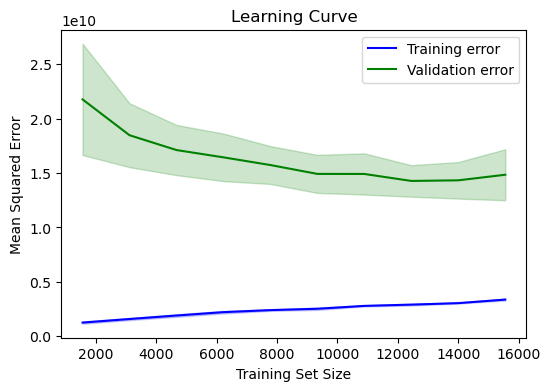

In [123]:
# Plot the learning curve to analyze training and validation error over different training set sizes
model = best_rf

train_sizes, train_scores, val_scores = learning_curve(
    model, X_train_val, y_train_val, 
    train_sizes=np.linspace(0.1, 1.0, 10),  
    cv=5,  
    scoring='neg_mean_squared_error',  
    n_jobs=-1
)

train_mean = -train_scores.mean(axis=1)  
val_mean = -val_scores.mean(axis=1)  
train_std = train_scores.std(axis=1)
val_std = val_scores.std(axis=1)

plt.figure(figsize=(6, 4))
plt.plot(train_sizes, train_mean, label='Training error', color='blue')
plt.plot(train_sizes, val_mean, label='Validation error', color='green')

plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color='blue')
plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.2, color='green')

plt.xlabel('Training Set Size')
plt.ylabel('Mean Squared Error')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

## Gradient Boosing Regressor

### Feature and Target Separation

In [6]:
# Separate features (X) and target (y) for prediction
X = df.drop(columns=['price'])
y = df['price']

In [7]:
# Split data into training, validation, and testing sets (70% train, 15% validation, 15% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=42)

### Model Training

In [8]:
# Train a Gradient Boosting Regressor model using the training data
gb_regressor = GradientBoostingRegressor(random_state=42)
gb_regressor.fit(X_train, y_train)

GradientBoostingRegressor(random_state=42)

In [9]:
# Train model and evaluate its performance using various metrics
y_pred = gb_regressor.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R²): {r2}")

Mean Absolute Error (MAE): 83694.65262185305
Mean Squared Error (MSE): 21830059712.20876
Root Mean Squared Error (RMSE): 147749.99056585
R-squared (R²): 0.8604327905185611


### Feature Importance

In [10]:
# Display the feature importances from the Random Forest Regressor model
feature_importances = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': gb_regressor.feature_importances_
})

feature_importances = feature_importances.sort_values(by='Importance', ascending=False)
feature_importances

,Feature,Importance
2,sqft_living,0.336477
8,grade,0.307296
14,lat,0.152147
15,long,0.054681
5,waterfront,0.033735
11,yr_built,0.031987
6,view,0.021890
16,sqft_living15,0.021837
13,zipcode,0.015444
9,sqft_above,0.009912


### Model Training After Feature Reduction

In [11]:
# Create a copy of the features DataFrame and drop specific columns
X_copy = X.copy()
X_copy = X_copy.drop(columns=['sqft_above', 'bathrooms', 'sqft_lot', 'condition', 'sqft_lot15', 'yr_renovated', 'sqft_basement',
'bedrooms', 'floors'])

In [12]:
# Split data into training, validation, and testing sets (70% train, 15% validation, 15% test)
X_train, X_test, y_train, y_test = train_test_split(X_copy, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=42)

In [13]:
# Train model and evaluate its performance using various metrics
gb_regressor.fit(X_train, y_train)
y_pred = gb_regressor.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R²): {r2}")

Mean Absolute Error (MAE): 83439.29402817853
Mean Squared Error (MSE): 20556240845.04841
Root Mean Squared Error (RMSE): 143374.47766268725
R-squared (R²): 0.888120485902554


### Bayesian Optimization

In [14]:
# Perform Bayesian hyperparameter optimization for the Random Forest Regressor model and display the best parameters
warnings.filterwarnings('ignore', category=UserWarning, module='skopt')

search_spaces = {
    'n_estimators': Integer(100, 500),  
    'max_depth': Integer(10, 50), 
    'min_samples_split': Integer(2, 20), 
    'min_samples_leaf': Integer(1, 10),  
    'max_features': Categorical(['sqrt', 'log2', None])  
}

bayes_search = BayesSearchCV(
    estimator=gb_regressor,  
    search_spaces=search_spaces,
    n_iter=50, 
    cv=5, 
    scoring='neg_mean_squared_error',  
    n_jobs=-1,
    random_state=42
)

bayes_search.fit(X_train, y_train)

best_params = bayes_search.best_params_
best_gb = bayes_search.best_estimator_

print("Best Parameters:", best_params)

Best Parameters: OrderedDict({'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 20, 'n_estimators': 101})


In [16]:
# Combine train and validation sets, retrain the model, and evaluate on the test set
X_train_val = np.vstack((X_train, X_val))  
y_train_val = np.hstack((y_train, y_val)) 

best_gb.fit(X_train_val, y_train_val)

y_pred = best_gb.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R²): {r2}")

Mean Absolute Error (MAE): 70957.2772638656
Mean Squared Error (MSE): 17439222328.30102
Root Mean Squared Error (RMSE): 132057.64774635743
R-squared (R²): 0.9050851887251735


c:\Users\Lenovo\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  warnings.warn(


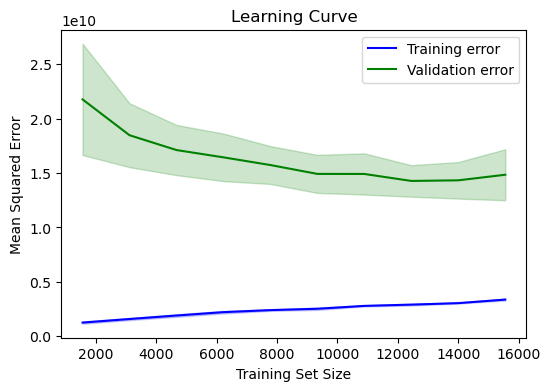

In [17]:
# Plot the learning curve to analyze training and validation error over different training set sizes
model = best_gb

train_sizes, train_scores, val_scores = learning_curve(
    model, X_train_val, y_train_val, 
    train_sizes=np.linspace(0.1, 1.0, 10),  
    cv=5,  
    scoring='neg_mean_squared_error',  
    n_jobs=-1
)

train_mean = -train_scores.mean(axis=1)  
val_mean = -val_scores.mean(axis=1)  
train_std = train_scores.std(axis=1)
val_std = val_scores.std(axis=1)

plt.figure(figsize=(6, 4))
plt.plot(train_sizes, train_mean, label='Training error', color='blue')
plt.plot(train_sizes, val_mean, label='Validation error', color='green')

plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color='blue')
plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.2, color='green')


plt.xlabel('Training Set Size')
plt.ylabel('Mean Squared Error')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

## Linear Regression

### Pre-processing for Linear Regression

In [74]:
# Drop the 'id' columns from the DataFrame
df = df.drop(columns=['id'])

In [75]:
# Convert 'date' column to a formatted date and drop the original 'date' column
df['formatted_date'] = pd.to_datetime(df['date'], format="%Y%m%dT%H%M%S")
df['formatted_date'] = df['formatted_date'].dt.strftime('%Y-%m-%d')

df=df.drop(columns=['date'])

df[['formatted_date']]

,formatted_date
0,2014-10-13
1,2014-12-09
2,2015-02-25
3,2014-12-09
4,2015-02-18
...,...
21608,2014-05-21
21609,2015-02-23
21610,2014-06-23
21611,2015-01-16


In [76]:
# Extract year, month, and day from the formatted date and drop the 'formatted_date' column
df['formatted_date'] = pd.to_datetime(df['formatted_date'], errors='coerce')

df['year'] = df['formatted_date'].dt.year
df['month'] = df['formatted_date'].dt.month
df['day'] = df['formatted_date'].dt.day

df=df.drop(columns=['formatted_date'])

In [77]:
# Standardize the numerical columns using StandardScaler
columns_to_standardize = df.select_dtypes(include=['float64', 'int64']).columns.drop('price')
scaler = StandardScaler()
df[columns_to_standardize] = scaler.fit_transform(df[columns_to_standardize])

### Feature and Target Separation

In [85]:
# Separate features (X) and target (y) for prediction
X = df.drop(columns=['price'])
y = df['price']

In [86]:
# Split data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Model Training

In [88]:
# Train a Linear Regression model using the training data
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [89]:
# Evaluate the Linear Regression model on the test set using various metrics 
y_pred = lr.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R²): {r2}")

Mean Absolute Error (MAE): 126929.17347036526
Mean Squared Error (MSE): 44951491944.93199
Root Mean Squared Error (RMSE): 212017.6689451424
R-squared (R²): 0.7026559760834247
